In [1]:
%load_ext autoreload
%autoreload 2

%matplotlib inline

In [2]:
from datetime import datetime, timedelta
import gc
import numpy as np, pandas as pd
import lightgbm as lgb
from pathlib import Path
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation
from matplotlib.animation import FuncAnimation
from scipy import stats
import seaborn as sns
import re

In [3]:
path=Path('/models/covid19')
assert path.exists()

### Parameters

In [4]:
date = 'date'
country_region = 'country_region'
case_type = 'case_type'
people_total_tested_count = 'people_total_tested_count'
confirmed = 'Confirmed'
deaths = 'deaths'
daily_new_cases = 'daily_new_cases'

### Injest data

In [5]:
!ls {path}

covid_19_cases.csv  covid-19-data-resource-hub-covid-19-case-counts.zip
COVID-19_Cases.csv


In [6]:
df = pd.read_csv(path/'covid_19_cases.csv', low_memory=False)

In [7]:
pd.options.display.max_columns = 50
pd.options.mode.chained_assignment = None
# plt.style.use('fivethirtyeight')

In [8]:
df

,case_type,people_total_tested_count,cases,difference,date,combined_key,country_region,province_state,admin2,iso2,iso3,fips,lat,long,population_count,people_hospitalized_cumulative_count,data_source,prep_flow_runtime
0,Confirmed,NaN,0,0,2020-02-03,Switzerland,Switzerland,NaN,NaN,CH,CHE,NaN,46.818200,8.227500,8654618.0,NaN,2019 Novel Coronavirus COVID-19 (2019-nCoV) Da...,2020-05-05T23:29:19
1,Confirmed,NaN,23,0,2020-04-21,Antigua and Barbuda,Antigua and Barbuda,NaN,NaN,AG,ATG,NaN,17.060800,-61.796400,97928.0,NaN,2019 Novel Coronavirus COVID-19 (2019-nCoV) Da...,2020-05-05T23:29:19
2,Deaths,NaN,0,0,2020-03-01,Cyprus,Cyprus,NaN,NaN,CY,CYP,NaN,35.126400,33.429900,1207361.0,NaN,2019 Novel Coronavirus COVID-19 (2019-nCoV) Da...,2020-05-05T23:29:19
3,Deaths,NaN,0,0,2020-02-11,Jamaica,Jamaica,NaN,NaN,JM,JAM,NaN,18.109600,-77.297500,2961161.0,NaN,2019 Novel Coronavirus COVID-19 (2019-nCoV) Da...,2020-05-05T23:29:19
4,Confirmed,NaN,0,0,2020-02-06,Belize,Belize,NaN,NaN,BZ,BLZ,NaN,17.189900,-88.497600,397621.0,NaN,2019 Novel Coronavirus COVID-19 (2019-nCoV) Da...,2020-05-05T23:29:19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
739195,Confirmed,NaN,0,0,2020-01-22,"Ohio, West Virginia, US",US,West Virginia,Ohio,US,USA,54069.0,40.095545,-80.622040,41411.0,NaN,2019 Novel Coronavirus COVID-19 (2019-nCoV) Da...,2020-05-05T23:29:19
739196,Deaths,NaN,0,0,2020-01-22,"West Feliciana, Louisiana, US",US,Louisiana,West Feliciana,US,USA,22125.0,30.878829,-91.414854,15568.0,NaN,2019 Novel Coronavirus COVID-19 (2019-nCoV) Da...,2020-05-05T23:29:19
739197,Confirmed,NaN,0,0,2020-01-22,"Lincoln, Oklahoma, US",US,Oklahoma,Lincoln,US,USA,40081.0,35.702709,-96.881246,34877.0,NaN,2019 Novel Coronavirus COVID-19 (2019-nCoV) Da...,2020-05-05T23:29:19
739198,Confirmed,NaN,0,0,2020-01-22,"Tippecanoe, Indiana, US",US,Indiana,Tippecanoe,US,USA,18157.0,40.388727,-86.894140,195732.0,NaN,2019 Novel Coronavirus COVID-19 (2019-nCoV) Da...,2020-05-05T23:29:19


In [9]:
countries = df.country_region.unique()

In [10]:
print(f'There are {len(countries)} countries in this data set')
country_list = list(countries)
country_list.sort()
', '.join(country_list)

There are 186 countries in this data set


"Afghanistan, Albania, Algeria, Andorra, Angola, Antigua and Barbuda, Argentina, Armenia, Australia, Austria, Azerbaijan, Bahamas, Bahrain, Bangladesh, Barbados, Belarus, Belgium, Belize, Benin, Bhutan, Bolivia, Bosnia and Herzegovina, Botswana, Brazil, Brunei, Bulgaria, Burkina Faso, Burma, Burundi, Cabo Verde, Cambodia, Cameroon, Canada, Central African Republic, Chad, Chile, China, Colombia, Comoros, Congo (Brazzaville), Congo (Kinshasa), Costa Rica, Cote d'Ivoire, Croatia, Cruise Ship, Cuba, Cyprus, Czechia, Denmark, Djibouti, Dominica, Dominican Republic, Ecuador, Egypt, El Salvador, Equatorial Guinea, Eritrea, Estonia, Eswatini, Ethiopia, Fiji, Finland, France, Gabon, Gambia, Georgia, Germany, Ghana, Greece, Grenada, Guatemala, Guinea, Guinea-Bissau, Guyana, Haiti, Holy See, Honduras, Hungary, Iceland, India, Indonesia, Iran, Iraq, Ireland, Israel, Italy, Jamaica, Japan, Jordan, Kazakhstan, Kenya, Korea, South, Kosovo, Kuwait, Kyrgyzstan, Laos, Latvia, Lebanon, Liberia, Libya, Li

In [11]:
df.columns

Index(['case_type', 'people_total_tested_count', 'cases', 'difference', 'date',
       'combined_key', 'country_region', 'province_state', 'admin2', 'iso2',
       'iso3', 'fips', 'lat', 'long', 'population_count',
       'people_hospitalized_cumulative_count', 'data_source',
       'prep_flow_runtime'],
      dtype='object')

In [12]:
case_types = df.case_type.unique()
case_types

array(['Confirmed', 'Deaths'], dtype=object)

It seems that only the US has hospitalized people

In [13]:
df[df['people_hospitalized_cumulative_count'] > 0][country_region].unique()

array(['US'], dtype=object)

Change the date format and check the date range

In [14]:
df[date] = pd.to_datetime(df[date], infer_datetime_format=True)

In [15]:
df_grouped = df.groupby([date, country_region, case_type])['cases'].aggregate(['sum']).reset_index()

In [16]:
df_grouped

,date,country_region,case_type,sum
0,2020-01-22,Afghanistan,Confirmed,0
1,2020-01-22,Afghanistan,Deaths,0
2,2020-01-22,Albania,Confirmed,0
3,2020-01-22,Albania,Deaths,0
4,2020-01-22,Algeria,Confirmed,0
...,...,...,...,...
39055,2020-05-05,Yemen,Deaths,4
39056,2020-05-05,Zambia,Confirmed,138
39057,2020-05-05,Zambia,Deaths,3
39058,2020-05-05,Zimbabwe,Confirmed,34


In [17]:
df_grouped = pd.pivot_table(df_grouped, values = ['sum'], index=[date,country_region], columns = case_type).reset_index()

In [18]:
df_grouped.columns = [date, country_region, confirmed, deaths]

In [19]:
df_grouped.sort_values(date, inplace=True)

In [20]:
df_grouped[df_grouped.country_region == 'US']

,date,country_region,Confirmed,deaths
172,2020-01-22,US,1,0
358,2020-01-23,US,1,0
544,2020-01-24,US,2,0
730,2020-01-25,US,2,0
916,2020-01-26,US,5,0
...,...,...,...,...
18772,2020-05-01,US,1103309,64940
18958,2020-05-02,US,1132387,66366
19144,2020-05-03,US,1157888,67679
19330,2020-05-04,US,1180223,68919


In [21]:
df_grouped[date].min(), df_grouped[date].max()

(Timestamp('2020-01-22 00:00:00'), Timestamp('2020-05-05 00:00:00'))

#### Tested people grouping

In [22]:
df_grouped_tested = df.groupby([date, country_region])[people_total_tested_count].sum().reset_index()

In [23]:
df_grouped_tested[people_total_tested_count] = df_grouped_tested[people_total_tested_count].astype('int32')

In [24]:
df_grouped_tested[df_grouped_tested[people_total_tested_count] > 0]

,date,country_region,people_total_tested_count
15238,2020-04-12,US,5611784
15424,2020-04-13,US,5870012
15610,2020-04-14,US,6163240
15796,2020-04-15,US,6485510
15982,2020-04-16,US,6802128
16168,2020-04-17,US,7082736
16354,2020-04-18,US,7380964
16540,2020-04-19,US,7731728
16726,2020-04-20,US,8007102
16912,2020-04-21,US,8310356


In [25]:
df_grouped = df_grouped.merge(df_grouped_tested, on=[date, country_region], how='left')

In [26]:
assert df_grouped[people_total_tested_count].min() == 0

Unfortunately there are in this dataset only people tested count for the US

In [27]:
df_grouped_tested[df_grouped_tested[people_total_tested_count] > 0][country_region].unique()

array(['US'], dtype=object)

### Comparisons by Country

Filtering by one specific date

In [28]:
df_grouped_single_date = df_grouped[df_grouped.date == '2020-05-05']

In [29]:
df_grouped_single_date.sort_values([confirmed], ascending=[False], inplace=True)

In [30]:
df_grouped_single_date

,date,country_region,Confirmed,deaths,people_total_tested_count
19398,2020-05-05,US,1204199,71061,15088656
19430,2020-05-05,Spain,219329,25613,0
19499,2020-05-05,Italy,213013,29315,0
19402,2020-05-05,United Kingdom,196243,29501,0
19523,2020-05-05,France,170687,25537,0
...,...,...,...,...,...
19381,2020-05-05,Mauritania,8,1,0
19356,2020-05-05,Papua New Guinea,8,0,0
19460,2020-05-05,Bhutan,7,0,0
19408,2020-05-05,Western Sahara,6,0,0


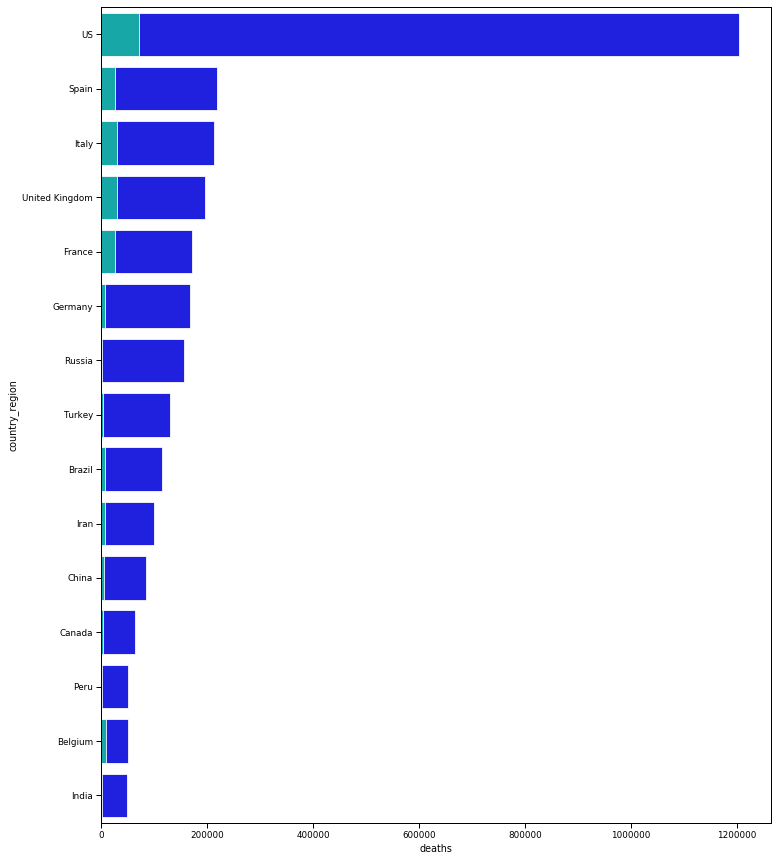

In [31]:
num_countries = 15
sns.set_context('paper')
f, ax = plt.subplots(figsize = (12,15))
sns.barplot(x = confirmed, y = country_region, data = df_grouped_single_date[:num_countries],
            label = 'Confirmed Cases', color = 'b', edgecolor = 'w')
sns.barplot(x = deaths, y = country_region, data = df_grouped_single_date[:num_countries],
            label = 'Confirmed Cases', color = 'c', edgecolor = 'w')

In [32]:
def distribution_plot(labels= ['Days with cases', 'Days with no cases'], 
                      percentages=[50, 50],
                     title=""):
    fig, ax = plt.subplots(figsize = (7,7))
    if len(labels) == 2:
        explode=(0.1,0)
        ax.pie(percentages, explode=explode, labels=labels, autopct='%1.0f%%', 
               shadow=False, startangle=0,   
               pctdistance=1.2, labeldistance=1.4)
    else:
        ax.pie(percentages, labels=labels, autopct='%1.0f%%', 
               shadow=False, startangle=0,   
               pctdistance=1.2,labeldistance=1.4)
    ax.axis('equal')
    ax.set_title(title)
    ax.legend(frameon=False, bbox_to_anchor=(1.5,0.8))

In [33]:
def calc_pct(df):
    return df[confirmed]/df[confirmed].sum() * 100

In [34]:
def single_date_pie(date_str='2020-04-27'):
    df_grouped_single_date = df_grouped[df_grouped.date == date_str]
    df_grouped_single_date.sort_values([confirmed], ascending=[False], inplace=True)
    df_grouped_single_date_pct = calc_pct(df_grouped_single_date)
    distribution_plot(labels=df_grouped_single_date[country_region][:num_countries], 
                      percentages=df_grouped_single_date_pct[:num_countries],
                      title='Distribution Confirmed Worldwide')

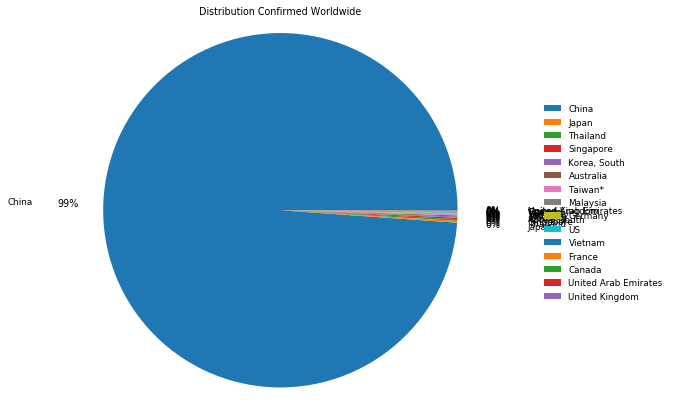

In [35]:
single_date_pie('2020-02-01')

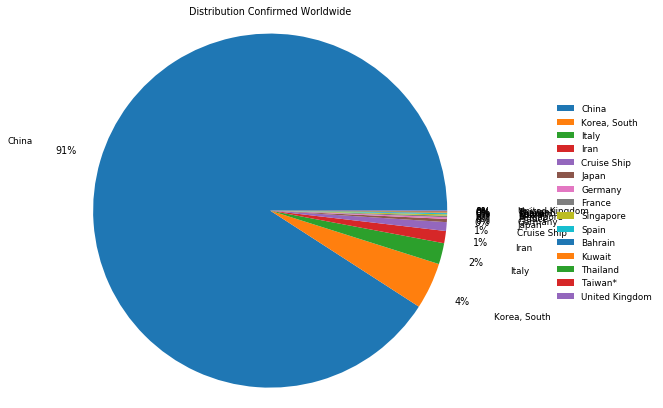

In [36]:
single_date_pie('2020-03-01')

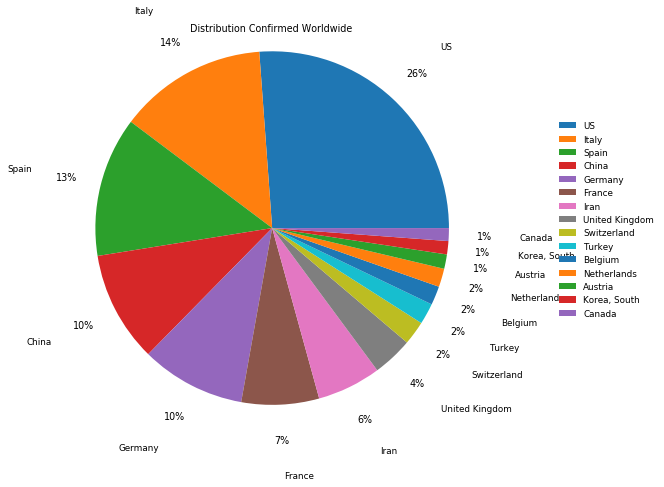

In [37]:
single_date_pie('2020-04-01')

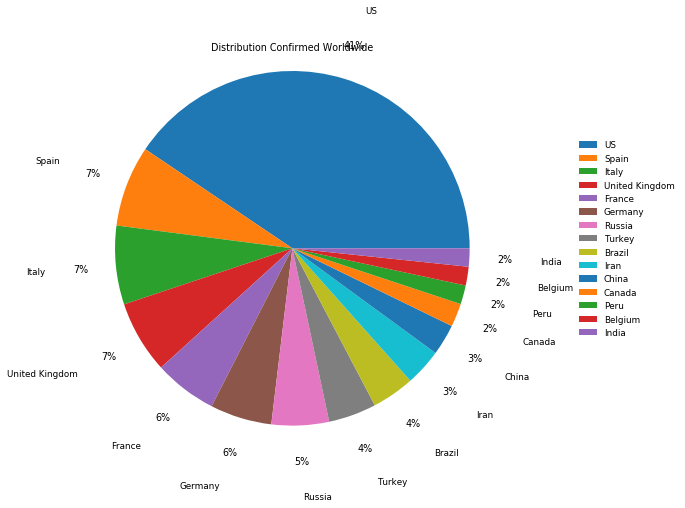

In [38]:
single_date_pie('2020-05-05')

In [39]:
%%capture

def calc_pie_plot_data(increment=0):
    day = df_grouped.date.min() + timedelta(days=increment)
    df_grouped_single_date = df_grouped[df_grouped.date == day]
    df_grouped_single_date.sort_values([confirmed], ascending=[False], inplace=True)
    df_grouped_single_date_pct = calc_pct(df_grouped_single_date)
    return df_grouped_single_date[country_region][:num_countries], df_grouped_single_date_pct[:num_countries], day

In [40]:
labels, percentages, day = calc_pie_plot_data(1)
re.sub(r'\s.+', '', str(day))

'2020-01-23'

In [41]:
unique_countries = df_grouped.country_region.unique()
country_length = len(unique_countries)
rand_colors = abs(np.random.random(country_length * 3).reshape(country_length, 3))
color_map = {country: tuple(color) for country, color in zip(unique_countries, rand_colors)}

In [42]:
%%capture
fig, ax = plt.subplots(figsize = (13, 8))

In [43]:
days_in_dataset = len(df_grouped.date.unique())

def update(num):
    ax.clear()
    ax.axis('equal')
    labels, percentages, day = calc_pie_plot_data(num)
    colors = [color_map[country] for country in labels]
    ax.pie(percentages, labels=labels, colors = colors,
            autopct='%1.0f%%', shadow=False, startangle=0, pctdistance=1.2, labeldistance=1.4)
    day_str = re.sub(r'\s.+', '', str(day))
    ax.set_title(f"Confirmed Cases on {day_str}")
    ax.legend(frameon=False, bbox_to_anchor=(0.0,0.8))

ani = FuncAnimation(fig, update, frames=range(days_in_dataset), repeat=False, interval=750)
plt.show()

from IPython.display import HTML
HTML(ani.to_jshtml())

### Focus on single country
Here we create a filtered data set for one single country

In [44]:
country = 'United Kingdom'

In [45]:
df_country = df_grouped[df_grouped[country_region] == country]

In [46]:
%%capture

fig, ax = plt.subplots(figsize = (10,7));

In [47]:
timestamps = [df_grouped[date].min() + timedelta(days=i) for i in range(len(df_country))]
t = range(len(timestamps))

ax.axis([0,len(timestamps),0, df_country[confirmed].max()]);
ax.set_title(f'Confirmed in {country}')
l, = ax.plot([],[]);

def animate(i):
    confirmed_list = list(df_country[df_country[date].isin(timestamps[:i])][confirmed])
    l.set_data(t[:i], confirmed_list)

ani = FuncAnimation(fig, animate, frames=len(t));

from IPython.display import HTML
HTML(ani.to_jshtml())

Sort by date

In [48]:
df_country.sort_values([date], inplace=True)

In [49]:
df_country[date].min(), df_country[date].max()

(Timestamp('2020-01-22 00:00:00'), Timestamp('2020-05-05 00:00:00'))

Confirmed minus Deaths

In [50]:
df_country['active_cases'] = df_country[confirmed] - df_country[deaths]

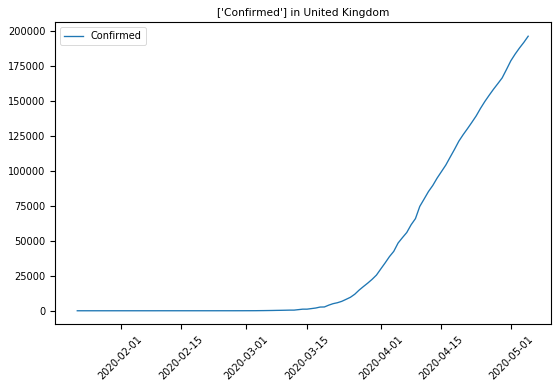

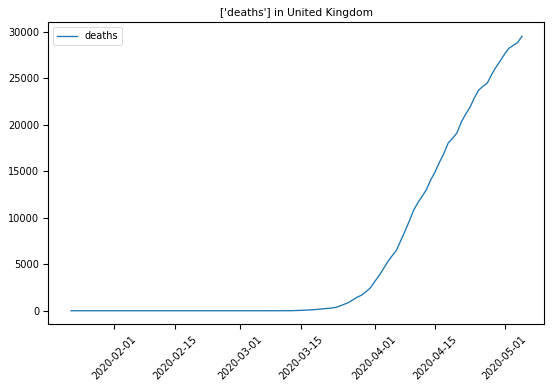

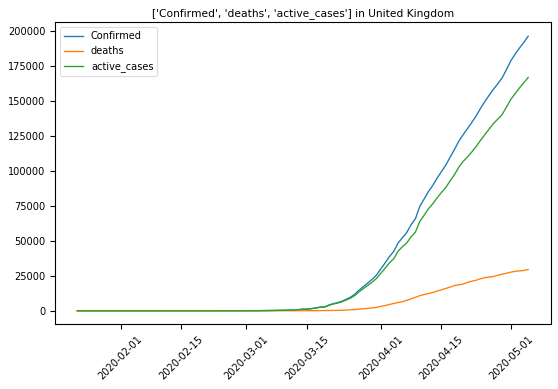

In [51]:
def display_plots(df, fields):
    # Get current size
    fig_size = plt.rcParams["figure.figsize"]
    fig_size[0] = 8
    fig_size[1] = 5
    fig, ax = plt.subplots(dpi=80)
    plt.xticks(rotation=45)
    for f in fields:
        ax.plot(df[date], df[f], label=f)
    ax.legend();
    ax.set_title(f'{fields} in {country}')

display_plots(df_country, [confirmed])
display_plots(df_country, [deaths])
if country == 'US':
    display_plots(df_country, ['People_Total_Tested_Count'])
display_plots(df_country, [confirmed, deaths, 'active_cases'])
if country == 'US':
    display_plots(df_country, [confirmed, deaths, 'People_Total_Tested_Count'])

In [52]:
df_country['Cases_Previous_Day'] = df_country[[date, confirmed]].sort_values(date)[confirmed].shift(1)

## Daily Cases

In [53]:
df_country['Cases_Previous_Day'] = df_country[[date, confirmed]].sort_values(date)[confirmed].shift(1)
df_country[daily_new_cases] = df_country.sort_values(date)[confirmed] - df_country.sort_values(date)['Cases_Previous_Day']

In [54]:
df_country['Deaths_Previous_Day'] = df_country[[date, deaths]].sort_values(date)[deaths].shift(1)
df_country['Daily_New_Deaths'] = df_country.sort_values(date)[deaths] - df_country.sort_values(date)['Deaths_Previous_Day']

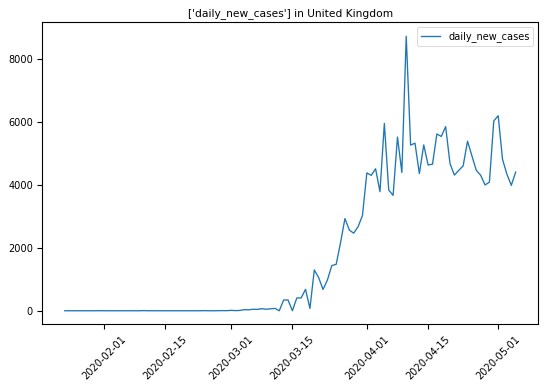

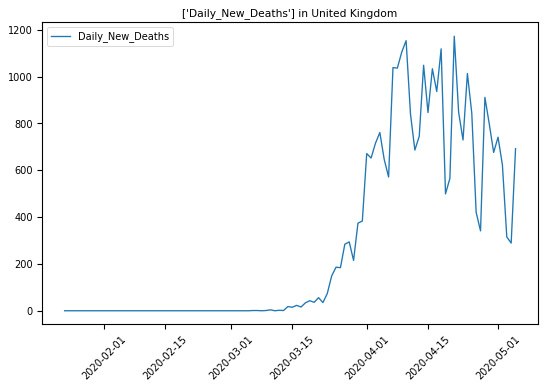

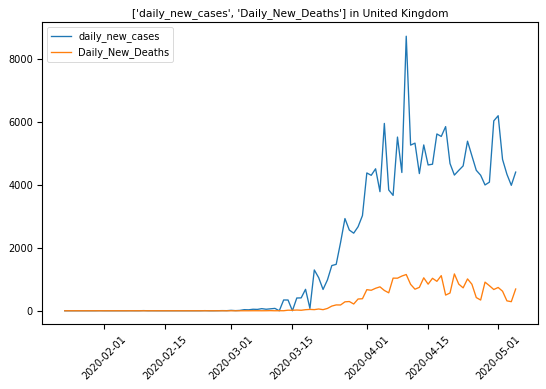

In [55]:
display_plots(df_country, [daily_new_cases])
display_plots(df_country, ['Daily_New_Deaths'])
display_plots(df_country, [daily_new_cases, 'Daily_New_Deaths'])

### Trying to recognize trends

Here we are trying to recognize the trend with running averages

In [56]:
period = 7
df_country['Weekly_New_Cases_Avg'] = df_country[daily_new_cases].transform(lambda x : x.rolling(period).mean())
df_country['Weekly_New_Cases_Std'] = df_country[daily_new_cases].transform(lambda x : x.rolling(period).std())

In [57]:
period = 15
df_country['Bi_Weekly_New_Cases_Avg'] = df_country[daily_new_cases].transform(lambda x : x.rolling(period).mean())
df_country['Bi_Weekly_New_Cases_Std'] = df_country[daily_new_cases].transform(lambda x : x.rolling(period).std())

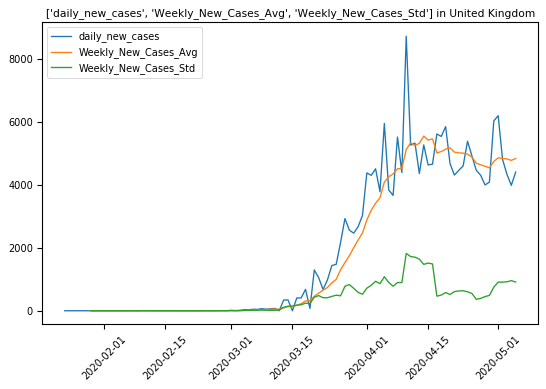

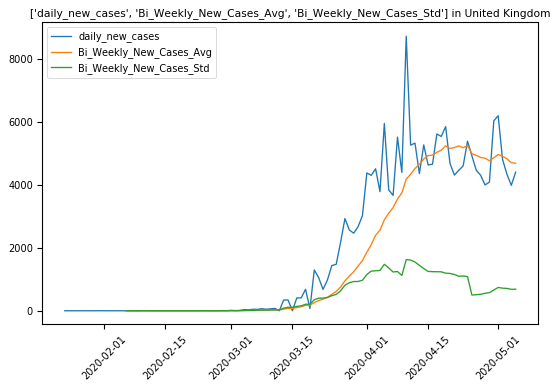

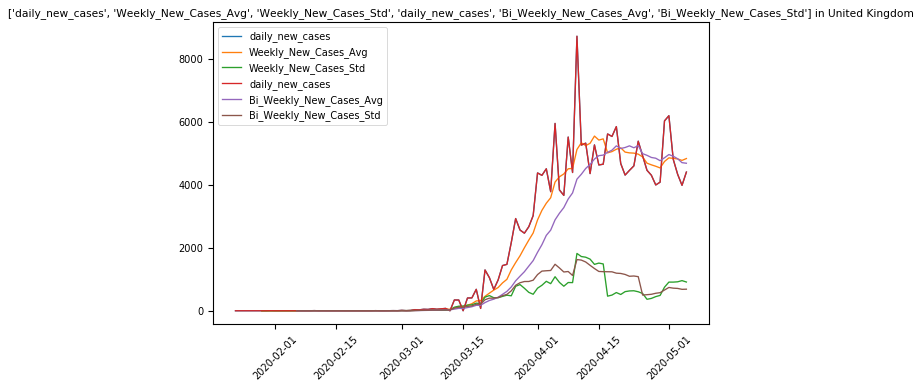

In [58]:
weekly_view = [daily_new_cases, 'Weekly_New_Cases_Avg', 'Weekly_New_Cases_Std']
by_weekly_view = [daily_new_cases, 'Bi_Weekly_New_Cases_Avg', 'Bi_Weekly_New_Cases_Std']
display_plots(df_country, weekly_view)
display_plots(df_country, by_weekly_view)
display_plots(df_country, weekly_view + by_weekly_view)

### Simple Distributions

In [59]:
list(df_country.columns)

['date',
 'country_region',
 'Confirmed',
 'deaths',
 'people_total_tested_count',
 'active_cases',
 'Cases_Previous_Day',
 'daily_new_cases',
 'Deaths_Previous_Day',
 'Daily_New_Deaths',
 'Weekly_New_Cases_Avg',
 'Weekly_New_Cases_Std',
 'Bi_Weekly_New_Cases_Avg',
 'Bi_Weekly_New_Cases_Std']

In [60]:
days_with_cases = len(df_country[df_country[daily_new_cases] > 0])
days_with_no_cases = len(df_country[df_country[daily_new_cases] == 0])

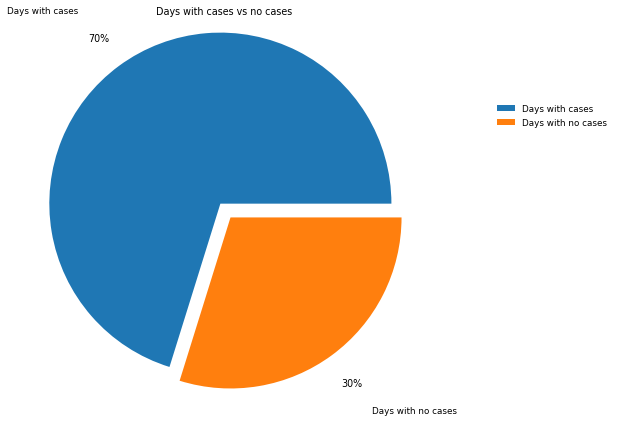

In [61]:
distribution_plot(['Days with cases', 'Days with no cases'], [days_with_cases, days_with_no_cases], 
                  "Days with cases vs no cases")

## Outliers

In [62]:
df_country_daily_new_cases = df_country[df_country[daily_new_cases] > 0][[date, daily_new_cases]]

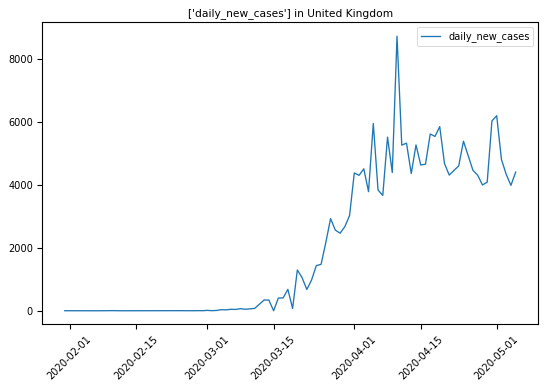

In [63]:
display_plots(df_country_daily_new_cases, [daily_new_cases])

In [64]:
df_country_daily_new_cases['Daily_New_Cases_zscore'] = stats.zscore(df_country_daily_new_cases[daily_new_cases])

In [65]:
df_country[daily_new_cases].mean(), df_country[daily_new_cases].std()

(1886.951923076923, 2301.8785590423295)

In [66]:
def plot_outliers(level=2):
    country_outliers = df_country_daily_new_cases[
        np.abs(df_country_daily_new_cases['Daily_New_Cases_zscore']) > level][[date, daily_new_cases, 'Daily_New_Cases_zscore']]
    distribution_plot(['No outliers', 'outliers'], 
                  [len(df_country_daily_new_cases) - len(country_outliers), len(country_outliers)],
                 "Outliers vs no outliers")
    return country_outliers

,date,daily_new_cases,Daily_New_Cases_zscore
14750,2020-04-10,8733.0,2.620224


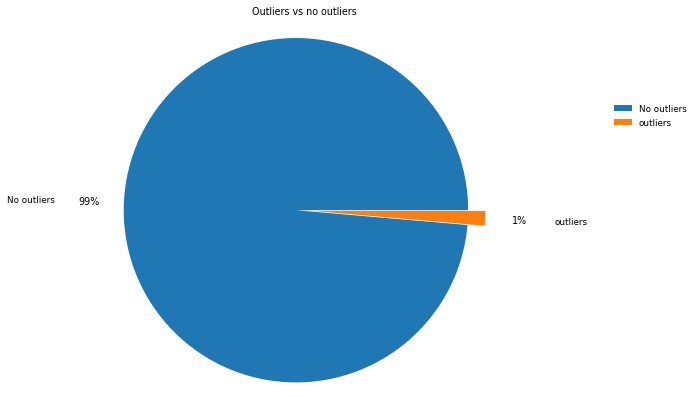

In [67]:
plot_outliers(2)

,date,daily_new_cases,Daily_New_Cases_zscore


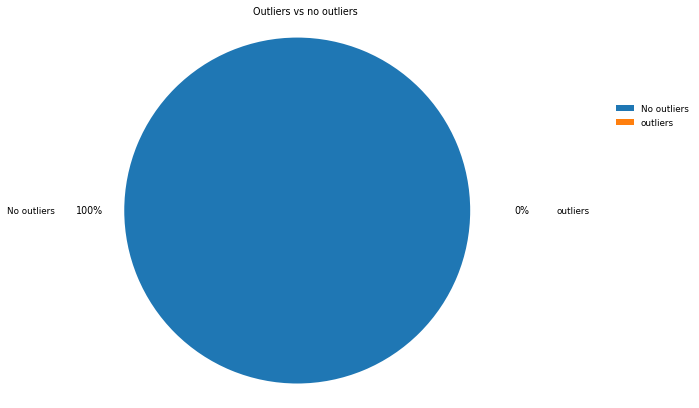

In [68]:
plot_outliers(3)